# Data assimilation 1 

This is the first of two lectures on **data assimilation**. Their aim is to provide an introduction to this topic in the context of climate science. The lectures are accompanied by two practical sessions where you will apply the ideas yourself.
In these lectures, we focus on simple "toy problems" that can be solved easily on a laptop. Nevertheless, the ideas discussed are general and can be applied to the large-scale data assimilation problems occurring in climate science.

## Weather forecasts

Weather forecasts are the most familiar, and perhaps the most important, application of data assimilation. Of course, most people have not heard the term "data assimilation" and have not thought about how weather forecasts are generated. The idea, in outline, is as follows. 

Let us assume that the physics of the weather system is known. This means that if we know the state of the system at some time, then we can calculate its state at any future time by solving the relevant equations. In practice, solving these equations means running 
forward in time a large-scale numerical model for the weather system.

We cannot, of course, measure the state of the system perfectly at any single time. Instead we have **noisy partial observations** of the weather's state at a set of observation times. If we guessed the initial state at some point in the past, we could evolve the system forward in time, calculating predictions for each available observation. Such an initial guess is unlikely to fit the observations satisfactorially, but we might somehow update the initial guess until the available data has been explained. 

Having, in this manner, estimated the initial state, we could carry our simulation forward into the future to arrive at the desired weather forecast. Because the data available is limited both in quantity and its accuracy, our reconstruction of the initial state will never be perfect, and hence uncertainties in this state are propagated into the resulting forecasts. The quantification of these uncertainties is the most important and most challenging aspect of data assimilation problems. 

There are at two main approaches to solving data assimilation problems. The first poses the estimation of the initial state as an **optimisation problem**, this being essentially the method just outlined. The second, which is a little harder to explain in outline, is to formulate the problem using the methods of **Bayesian inference**. While these approaches are 
not equivalent, there do exist relations between them. In these lectures, we focus on the Bayesian formulation of data assimilation problems because it allows for a simpler, and arguably superior, treatment of uncertainty quantification. 


## Dynamical systems

### The finite pendulum

To motivate the definition of a **dynamical system** we consider an idealised **finite pendulum**. Such a pendulum comprises a bob of mass, $m$, attached to one end of a massless and rigid rod of length, $l$. The other end of the rod is fixed at a point, with the rod being able to pivot about this point freely within a plane. We write $\theta$ for the angle between the rod and a line that points vertically downward. For convenience, we choose a co-ordinate system whose origin is at the pivot point of the rod, and suppose that the pendulum moves in the $(x,y)$-plane, with the x-axis horizontal and the y-axis pointing vertically upwards. The Cartesian co-ordinates of the pendulum bob can then be written

$$
x = l \sin\theta, \quad y = -l\cos\theta.
$$

This shows that the position of the pendulum at any time is determined completely by the angle, $\theta$.

We suppose that the pendulum is acted on by a constant gravitational force acting vertically downwards, and write, $g$, for the associated gravitational acceleration. From Newton's laws of motion, this physical system is governed by following set of ordinary differential equations:

$$
\frac{\mathrm{d} \theta}{\mathrm{d} t} = \frac{1}{ml^{2}}p, \quad \frac{\mathrm{d} p}{\mathrm{d} t} = - mgl \sin \theta
$$

Here $p$ represents the (angular) momentum of the pendulum bob. If desired, these two equations can be combined into the single second-order equation

$$
\frac{\mathrm{d}^{2} \theta}{\mathrm{d} t^{2}} = -\frac{g}{l}\sin \theta,
$$

where we note that the mass has been eliminated. For our purposes, however, it is more convenient to work with the coupled first-order system of equations.

Given initial values for the angle, $\theta$, and momentum, $p$, of the pendulum at a time $t_{0}$, the above equations can be integrated to uniquely determine their values for all later times. The state of this system at any time is, therefore, expressed fully by its **state vector**

$$
\mathbf{y} = \left(\begin{array}{c}
             \theta  \\ p
             \end{array}\right)
$$

in terms of which we can write an **evolution equation** in the general form

$$
\frac{\mathrm{d} \mathbf{y}}{\mathrm{d} t} = \mathbf{f}(\mathbf{y}),
$$
with $\mathbf{f}$ defined appropriately. 

These ideas are illustrated within the following code block which generates an animation of the pendulum's motion subject to given initial conditions.

In [1]:
import numpy as np
from data_assimilation import pendulum

# Set the initial state and evolve the system in time
initial_angle = np.deg2rad(110)
initial_momentum = 0.0
initial_state = [initial_angle, initial_momentum]
t_points = np.linspace(0, 16, 100) 
solution = pendulum.solve_trajectory_rk45(pendulum.eom_single, initial_state, t_points)

# Animate the physical motion and the state space evolution
anim = pendulum.create_combined_animation_single(t_points, solution)
pendulum.display_animation_html(anim)

Rendering animation for notebook... (this may take a minute)


### Autonomous dynamical systems

Building on the above example, we can consider a more general **dynamical system** for which an $m$-dimensional state vector, $\mathbf{y}$, is governed by an evolution equation taking the  standard form
$$
\frac{\mathrm{d} \mathbf{y}}{\mathrm{d} t} = \mathbf{f}(\mathbf{y}),
$$
with $\mathbf{f}$ a function, known as the **dynamical rule**, which takes values the **state space**, $\mathbb{R}^{n}$. If the value of the state vector is given at a time, $t_{0}$, then these equations can be integrated to **uniquely determine** the state vector at any later time (strictly, for non-linear systems this result is only guaranteed to hold for some finite length of time, but we will not worry about such technical details).

Within the above equation, the time-derivative of the state vector is given by a function of the state vector alone. Such a dynamical system is said to be **autonomous**. There are also **non-autonomous** dynamical systems whose evolution equation has an explicit dependence on time, i.e., the dynamical rule takes the form $(\mathbf{y},t)\mapsto \mathbf{f}(\mathbf{y},t)$. This feature typically represents the action of some **external forcing** on the system. For simplicity we will consider only autonomous systems in these lectures, though in fact there is a trick by which a non-autonomous system can always be transformed into an autonomous one on a larger state space. 

It should be clear that the solution, $\mathbf{y}(t)$ to an autonomous dynamical system depends only on the difference, $t-t_{0}$, and hence we are free to take the initial time to always be zero. 

A dynamical system is said to be **linear** if the dynamical rule takes the form

$$
\mathbf{f}(\mathbf{y}) = \mathbf{A}\mathbf{y},
$$

where $\mathbf{A}$ is matrix that maps the state space to itself. Otherwise, the dynamical system is **non-linear**. Clearly the finite pendulum example is non-linear, and this is also true for most physical models. 




### The weather as a dynamical system

The physics describing the weather can be formulated as a dynamical system, albeit a rather complicated one. In this context, the state vector, $\mathbf{y}$, comprises continuous fields, such as temperature, pressure, and wind velocity,  defined at every point within the Earth's atmosphere. Consequently, the state space is  **infinite-dimensional**, while the dynamical rule is given through coupled systems of partial differential equations that express the conservation of quantities like mass, linear momentum, and energy. Dynamical systems for the weather are generally not autonomous due to forcing, through appropriate boundary conditions, from the oceans and ice sheets.

To address the infinite-dimensional complication, the most common method is to approximate the true dynamical system by a finite-dimensional one that arises through a **numerical approximation**. For example, the physical fields can be approximated through their values on a grid of points, and the various spatial derivatives within the partial differential equations are then replaced using finite-difference formulae. The arguments in favour of this approach are that (i) in any practical situation the true dynamics will eventually be reduced to a finite-dimensional form within numerical calculations, and (ii) by limiting attention to finite dimensional systems the mathematics us much simpler. 

Alternatively, it is possible to formulate and solve data assimilation problems on infinite dimensional state spaces, with such methods offering both conceptual and practical advantages. The key idea is to first formulate and solve the data assimilation problem on the appropriate infinite-dimensional space, and then show that this solution can be obtained to a desired level of accuracy through convergent numerical discretisation. 

Within this introductory set of lectures we will restrict attention to finite-dimensional problems. Our examples will have state spaces of dimensions 2 or 4, but for contemporary applications to weather forecasting, a state space whose dimension is of order $10^{8}-10^{9}$ would be typical. As we will see, the very high dimension of the state space, and the associated cost of solving the evolution equations, places severe limits on the methods that can be practically applied. 

### The flow of a dynamical system

Given an initial state vector, $\mathbf{y}_{0}$, at the time $t=0$, we have seen that the evolution equation can be integrated to determine the state vector, $\mathbf{y}(t)$, at any other time. The resulting curve $t\mapsto \mathbf{y}(t)$ in the state space depends parametrically on the chosen initial condition. To express this idea, we can introduce the **flow** for dynamical system. This mapping, $\bm{\Phi}:\mathbb{R}^{m}\times \mathbb{R} \rightarrow
\mathbb{R}^{m}$ is defined, by
$$
\bm{\Phi}(\mathbf{y}_{0}, t) = \mathbf{y}(t), 
$$
where $\mathbf{y}(t)$ denotes the solution of the evolution equation at time $t$ subject to the initial condition $\mathbf{y}_{0}$ at $t=0$. By definition, we clearly have $\Phi(\mathbf{y}_{0},0) = \mathbf{y}_{0}$, while the following identity is readily established
$$
\bm{\Phi}[\Phi(\mathbf{y}_{0}, t_{1}),t_{2}] = \bm{\Phi}(\mathbf{y}_{0}, t_{1}+t_{2}). 
$$
If we fix the time, $t$, then the flow induces a mapping, $\bm{\Phi}_{t}:\mathbb{R}^{m}\rightarrow \mathbb{R}^{m}$, from the state space to itself through
$$
\Phi_{t}(\mathbf{y}_{0}) = \Phi(\mathbf{y}_{0},t). 
$$
Clearly this mapping is invertible, with the inverse given by 
$$
\Phi_{t}^{-1}(\mathbf{y}) =  \Phi(\mathbf{y},-t).
$$
This result shows that we can recover the initial state of a sytem from its current state by integrating the evolution equation back in time. It should be commented that while this is true in principle, it can be difficult to do stably for dissipative systems. 

### Linearisation of the dynamical system

Consider two initial states, $\mathbf{y}_{0}$ and $\mathbf{y}_{0} + \Delta \mathbf{y}_{0}$, with their difference, $\Delta \mathbf{y}_{0}$, being suitably small. The difference in the 
resulting states at a time, $t$, can then be written
$$
\Phi_{t}(\mathbf{y}_{0} + \Delta \mathbf{y}_{0}) - \bm{\Phi}_{t}(\mathbf{y}_{0}) = \frac{\partial \Phi_{t}}{\partial \mathbf{y}_{0}}(\mathbf{y}_{0}) \Delta \mathbf{y}_{0} + o(\|\Delta \mathbf{y_{0}\|}), 
$$
where we have performed a first-order Taylor expansion to obtain the right hand side. The partial derivative occurring in this expression is matrix-valued, and expresses the linearised
sensitivity of the flow of the dynamical system to the initial conditions. 

To calculate $\frac{\partial \Phi_{t}}{\partial \mathbf{y}_{0}}(\mathbf{y}_{0})$ we can implicitly differentiate the evolution equation with respect to the initial condition. 
Letting $\mathbf{y}(t)$ be the solution of the evolution equation subject to initial condition, $\mathbf{y}_{0}$, we then obtain using the chain rule
$$
\frac{\mathrm{d}}{\mathrm{d} t}\frac{\partial \mathbf{y}}{\partial \mathbf{y}_{0}}(t) = \frac{\partial \mathbf{f}}{\partial \mathbf{y}}[\mathbf{y(t)}] \frac{\partial \mathbf{y}}{\partial \mathbf{y}_{0}}(t), 
$$
which is a linear ordinary differential equation for the matrix, $\frac{\partial \mathbf{y}}{\partial \mathbf{y}_{0}}$, that must be solved subject to the initial condition
$$
\frac{\partial \mathbf{y}}{\partial \mathbf{y}_{0}}(0) = \mathbf{1}, 
$$
with $\mathbf{1}$ the identity matrix on $\mathbb{R}^{m}$. Note that within this equation, the coefficient matrix, $\frac{\partial \mathbf{f}}{\partial \mathbf{y}}[\mathbf{y(t)}]$ is generally time-dependent due to its dependence on the reference state, $\mathbf{y}(t)$.
In this manner, we can write the desired partial derivative of the flow as
$$
\frac{\partial \Phi_{t}}{\partial \mathbf{y}_{0}}(\mathbf{y}_{0}) = \frac{\partial \mathbf{y}}{\partial \mathbf{y}_{0}}(t).
$$
The full **sensitivity matrix**, $\frac{\partial \Phi_{t}}{\partial \mathbf{y}_{0}}(\mathbf{y}_{0})$ can, therefore, be obtained numerically at a cost similar to $m+1$ integrations of the dynamical system, with the plus one due to the need to first obtain $\mathbf{y}(t)$.



## The Bayesian approach to data assimilation

### Expressing uncertainty on the initial state

Within a Bayesian framework, our knowledge of the initial state of the system in expressed in terms of a **probablity distribution**. In particular, the **prior probability distribution** specifies completely our knowledge 
of the intial state before have taken into account any of the available observations. 

We will write $\pi_{0}$ for this prior probability distribution, and assume that it can be written in terms of **probability density function**, $p_{0}$, with respect to the standard volume element on
the state space, $\mathbb{R}^{m}$. 
The probability that the initial state lies within a subset $U\subseteq \mathbb{R}^{m}$ can then be written
$$
\pi_{0}(U) = \int_{U} p_{0}(\mathbf{y}) \,\mathrm{d}\mathbf{y}.
$$
The value of this probability quantifies our **degree of our belief** that the statement $\mathbf{y}_{0} \in U$ is true. If $\pi_{0}(U)=1$ then we think that the statement is definitely true, while if $\pi_{0}(U)=0$ that it 
is definitely false. If for two subsets, $U,V\subseteq \mathbb{R}^{m}$ we have $\pi_{0}(U) < \pi_{0}(V)$ then we think it more likely that the initial state is in $\mathbf{y}_{0}$. Stating precisely how such probabilties
should be interpreted is an issue of philosophy and not mathematics and so will not be considered in detail. But it is worth emphasising that that in the Bayesian framework, probabilities are a
quantification of our beleifs and are **not** related to the relative frequencies of outcomes within a random but repeatable process.  

### Propagating uncertainties under the flow of the system

Suppose that we have a prior probability that expresses our knowledge about the a dynamical system's initial state. If there are no observations to futher constrain the system, then we will show 
that our knowledge of the state at later times is fully determined by evolving 
the prior distribution under the flow of the dynamical system.

Let us write $\pi_{t}$ for the probability distribution for the state at a time, $t$, this being the quantity we would like to  calculate. Given any $U\subseteq \mathbb{R}^{n}$, we know that  $\pi_{t}(U)$ represents the probability that the 
state vector, $\mathbf{y}(t)$, lies with this subset. Because, however, the flow of the dynamical system induces an invertible mapping, $\bm{\Phi}_{t}$, between states at times $0$ and $t$, the condition $\mathbf{y}(t) \in U$  is equivalent to $\mathbf{y}_{0} \in \bm{\Phi}_{t}^{-1}(U)$  for the initial condition, 
where we have defined the **inverse image** of the subset $U$ under the mapping, $\bm{\Phi}_{t}$, 
through
$$
\bm{\Phi}_{t}^{-1}(U) = \left\{
\mathbf{y}_{0} \in \mathbb{R}^{m} \,|\, \Phi_{t}(\mathbf{y_{0}}) \in U
\right\}. 
$$ 
Note that the inverse image is a well-defined subset for any mapping, but because 
$\bm{\Phi}_{t}$ is invertible, there is a one-to-one relationship between states
in $U$ and $\bm{\Phi}_{t}^{-1}(U)$.
Using this notations and results, we can then express the probability distribution at time, $t$, in the form
$$
\pi_{t}(U) = \pi_{0}[\bm{\Phi}_{t}^{-1}(U)].
$$ 
Equivalently, we write this as
$$
\pi_{t} = \pi_{0} \circ \bm{\Phi}_{t}^{-1}, 
$$
with the right hand side being called the **push-forward** of the probablity distribution, $\pi_{0}$, under the mapping, $\bm{\Phi}_{t}$.

### Transformation of the probability density functions

We assumed that the prior probability distribution is defined in terms of a probability density function, $p_{0}$. We now show that the same is true for the pushed-forward 
distribution, $\pi_{t}$, and hence the preceeding results can be made more concrete. Letting $p_{t}$ denote the PDF for $\pi_{t}$, we require that 
$$
\int_{U} p_{t}(\mathbf{y}) \,\mathrm{d}\mathbf{y} = \int_{\bm{\Phi}_{t}^{-1}(U)} p_{0}(\mathbf{y}_{0}) \,\mathrm{d}\mathbf{y}_{0},
$$
for any $U \subseteq \mathbb{R}^{n}$. Setting $\mathbf{y}_{0}  = \bm{\Phi}_{t}(\mathbf{y})$, an recalling the change of variables formula for integration, 
the left hand side of the above equality can be written
$$
\int_{U} p_{t}(\mathbf{y}) \,\mathrm{d}\mathbf{y} = \int_{\bm{\Phi}_{t}^{-1}(U)} p_{t}[\Phi_{t}(\mathbf{y}_{0})] \det\!\left[
    \frac{\partial \Phi_{t}}{\partial \mathbf{y}_{0}}(\mathbf{y}_{0})\right] \mathrm{d}\mathbf{y}_{0},
$$
where $\frac{\partial \Phi_{t}}{\partial \mathbf{y}_{0}}(\mathbf{y}_{0})$ is the matrix that entered into the linearisation of the flow, 
and $\det$ denotes the determinant of a matrix.  Because the subset $U$ was arbitary, 
it follows that
$$
p_{0}(\mathbf{y}_{0}) = p_{t}[\Phi_{t}(\mathbf{y}_{0})]  \det\!\left[
    \frac{\partial \Phi_{t}}{\partial \mathbf{y}_{0}}(\mathbf{y}_{0})\right], 
$$
and hence  the desired PDF can be written
$$
p_{t}(\mathbf{y}) = p_{0}[\bm{\Phi}_{t}^{-1}(\mathbf{y})]  \det\!\left\{
    \frac{\partial \Phi_{t}}{\partial \mathbf{y}_{0}}[\bm{\Phi}_{t}^{-1}(\mathbf{y})]\right\}.
$$



To apply the above formulae, we need to be able to integrate the dynamical system backwards in 
time, while we also need the determinant of the sensitivity matrix. This matrix can 
be determined using the methods discussed above, and then its determinant evaluated. However, it can be shown that
$$
\frac{\mathrm{d}}{\mathrm{d} t}\det \!\left[\frac{\partial \mathbf{y}}{\partial \mathbf{y}_{0}}(t)\right] = \mathrm{tr}\!\left\{\frac{\partial \mathbf{f}}{\partial \mathbf{y}}[\mathbf{y(t)}]\right\} \det \!\left[\frac{\partial \mathbf{y}}{\partial \mathbf{y}_{0}}(t)\right], 
$$
where $\mathrm{tr}$ denotes the trace of a matrix. This is a scalar differential equation for the 
determinant that can be solved subject to the initial condition, $\det \!\left[\frac{\partial \mathbf{y}}{\partial \mathbf{y}_{0}}(0)\right]=1$. 

### Application to the pendulum system

The above ideas can be readily illustrated for the pendulum system. The first step is calculating the matrix $\frac{\partial \mathbf{f}}{\partial \mathbf{y}}[\mathbf{y(t)}]$
for the dynamical rule. Recalling from earlier that 
$$
\mathbf{f}(\mathbf{y}) = \left(\begin{array}{c}
              \frac{1}{ml^{2}}p \\ - mgl \sin \theta
             \end{array}\right), 
$$
we find that the associated matrix of partial derivatives is then given by
$$
\frac{\partial \mathbf{f}}{\partial \mathbf{y}}[\mathbf{y(t)}] = \left(\begin{array}{cc}
              0 && \frac{1}{ml^{2}} \\ - mgl \cos \theta && 0
             \end{array}\right).
$$


The matrix, $\frac{\partial \mathbf{f}}{\partial \mathbf{y}}[\mathbf{y(t)}]$, is seen to have zero-trace, and hence for this system the determinant of the sensitivity matrix is constant. The transformation of the PDFs then reduces to
$$
p_{t}(\mathbf{y}) = p_{0}[\bm{\Phi}_{t}^{-1}(\mathbf{y})].
$$
This result follows from the fact that the equations for the pendulum system are Hamiltonian. This property is not typically present within climatological applications and so we will not emphasises this point further.

These ideas are applied numerically for the pendulum system. First, we define a simple Gaussian PDF for the prior distribution on the initial state at time, $t_{0} = 0$. For a later time, $t_{1}$, we can then visualise the prior PDF as follows:

- We form a regular grid in the state space that is sufficiently fine as to resolve the details of the two PDFs (the parameter, `res`, can be increased if the plot looks rough).
- For each state, $\mathbf{y}$, within this grid, we integrate the evolution equation backwards in time from $t_{1}$ to $t_{0}$. This gives the corresponding initial state, $\mathbf{y}_{0} = \bm{\Phi}_{t}^{-1}(\mathbf{y})$. We then evaluate the prior PDF at the initial time and use $p_{t_{1}}(\mathbf{y}) = p_{t_{0}}(\mathbf{y}_{0})$.

For a more general dynamical system, it would also be necessary to compute the appropriate determinant of the sensitivity matrix as discussed above. 


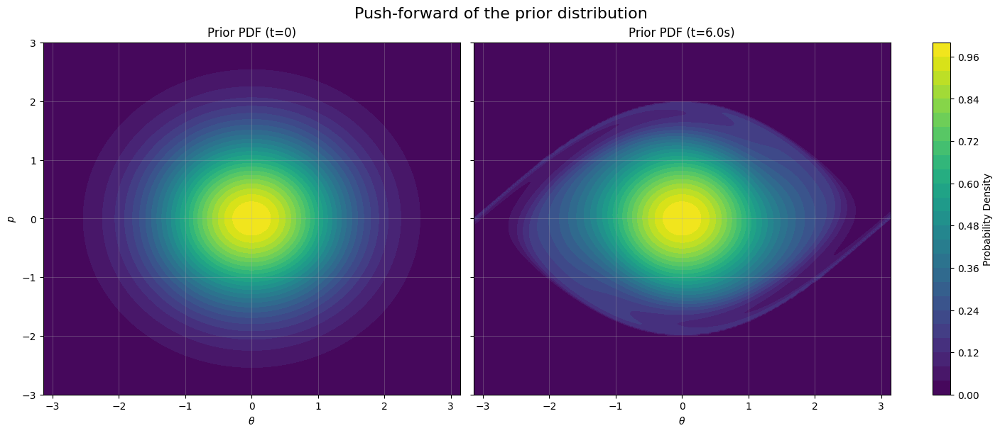

In [2]:
# Set up the prior distribution as a simple Gaussian
theta_mean = 0.0
p_mean = 0.0
theta_std = 1.0
p_std = 1.0

def gaussian_pdf(theta, p):    
    exponent = -0.5 * (
        ((theta - theta_mean) / theta_std)**2 + 
        ((p - p_mean) / p_std)**2
    )
    return np.exp(exponent)

# Set the initial and final times
t0 = 0.0
t1 = 6.0

# Set the resolution for the plots
res = 200

# Get the grid and the pdfs interpolated onto it
thetas, ps, prior_t0, prior_t1 = pendulum.advect_pdf_single(
    gaussian_pdf, 
    t1-t0, 
    res=res  
)

# Plot the prior PDFs at the initial and final times
pendulum.plot_pdf_advection_single(thetas, ps, prior_t0, prior_t1, t1)

### Updating beliefs in light of  observations

We now consider the dynamical system at a fixed time, and write $\mathbf{y}$ for the state vector. Suppose that our prior knowledge of the state is expressed through a probability distribution, $\pi$, with PDF, $p$.

A **noisy partial observation** of the state takes the form
$$
\mathbf{x} = \mathbf{g}(\mathbf{y}) + \mathbf{z}, 
$$
where the **observation function**, $\mathbf{g}:\mathbb{R}^{m}\rightarrow \mathbb{R}^{n}$, maps the state space to a lower dimensional observation space (i.e., $n < m$), and $\mathbf{z}$ is a random observational error. We suppose that $\mathbf{z}$  is sample from a known probability distribution with PDF denoted by $q$.

If the state, $\mathbf{y}$, were known, then $\mathbf{x} - \mathbf{g}(\mathbf{y})$ would be 
distributed according to error distribution, and hence the conditional PDF for $\mathbf{x}$ given 
$\mathbf{y}$ takes the simple form
$$
q[\mathbf{x} - \mathbf{g}(\mathbf{y})].
$$
Regarded as a function of the state vector, this quantity is  known as the **likelihood**
of $\mathbf{y}$ given $\mathbf{x}$.

Using **Bayes theorem**, the conditional PDF for the state vector, 
$\mathbf{y}$, given that observation, $\mathbf{x}$, has been made can  be written
$$
p(\mathbf{y}|\mathbf{x})  = \frac{q[\mathbf{x} - \mathbf{g}(\mathbf{y})] p(\mathbf{y})}{\int_{\mathbb{R}^{m}}
q[\mathbf{x} - \mathbf{g}(\mathbf{y})] p(\mathbf{y}) \,\mathrm{d}\mathbf{y}}.
$$
This is also known as the **posterior PDF** for the state vector.
On the right hand side of the above formula we see the product of the likelihood with the prior PDF for the state vector. The form of the denominator is set by the requirement that $p(\mathbf{y}|\mathbf{x})$ integrates to one over the 
state space. In fact, this integral is known as the **Bayesian evidence** and is equal to the probability that the observation, $\mathbf{x}$, has been made. Within the present context, the value of the Bayesian evidence  is not hugely significant, but this quantity is central within Bayesian hypothesis testing. 

These ideas can be readily applied to the pendulum problem. Within the previous section, we pushed forward the prior PDF on the initial state to the time $t_{1}$. Let us suppose that at this latter time we make an 
noisy observation of the angle, $\theta$. For simplicity we suppose that the error distribution takes a simple zero-mean Gaussian form. The product of the likelihood and prior PDF at $t_{1}$ can then be formed to determine the un-normalised posterior PDF on our numerical grid. The Bayesian evidence can then be computed using a simple quadrature scheme. 

In the code block below, we indicated this process visually, showing the prior, the likelihood and the posterior on the state space. 



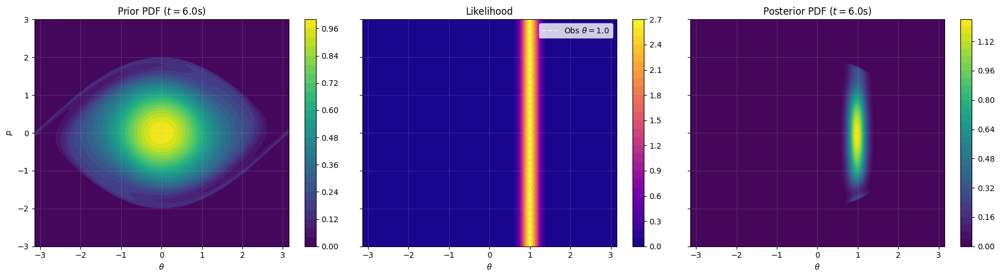

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Define the observation value and error distribution
x1 = 1.0     
z1_std = 0.15  

# 2. Calculate the Likelihood 
likelihood = norm.pdf(pendulum.wrap_angle(thetas), loc=x1, scale=z1_std)

# 3. Calculate and Normalize Posterior using module utilities
posterior_unnorm = likelihood * prior_t1
evidence = pendulum.compute_normalization(thetas, ps, posterior_unnorm)
posterior_t1 = posterior_unnorm / evidence

# 4. Visualization with independent scales for clarity
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

# Prior: The advected PDF before the observation
im1 = axes[0].contourf(thetas, ps, prior_t1, levels=30, cmap='viridis')
axes[0].set_title(f"Prior PDF ($t={t1:.1f}$s)")
fig.colorbar(im1, ax=axes[0])

# Likelihood: The constraint provided by the data
im2 = axes[1].contourf(thetas, ps, likelihood, levels=30, cmap='plasma')
axes[1].axvline(x1, color='white', linestyle='--', alpha=0.6, label = fr'Obs $\theta={{{x1}}}$')
axes[1].set_title(f"Likelihood")
axes[1].legend()
fig.colorbar(im2, ax=axes[1])

# Analysis: The state after Bayesian conditioning
im3 = axes[2].contourf(thetas, ps, posterior_t1, levels=30, cmap='viridis')
axes[2].set_title(f"Posterior PDF ($t={t1:.1f}$s)")
fig.colorbar(im3, ax=axes[2])

for ax in axes:
    ax.set_xlabel(r"$\theta$")
    ax.grid(alpha=0.2)
axes[0].set_ylabel(r"$p$")

plt.tight_layout()
plt.show()

Having formed the posterior distribution at time, $t_{1}$, we can evolve its PDF under the the dynamics until the next observation time, $t_{2}$. At this time, let us suppose that we make a second noisy observation of the angle, $\theta$. Using the pushed-forward posterior from $t_{1}$ as our prior, we can then apply Bayes theorem just as before to obtain a new posterior. 

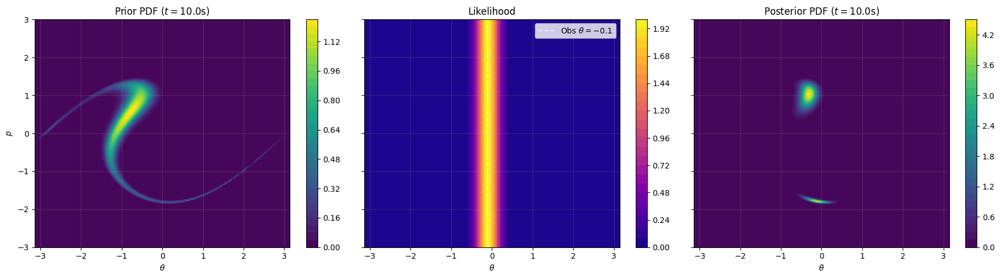

In [4]:
# Set up the new observation
t2 = 10.0
x2 = -0.1
z2_std = 0.2

# Use interpolation to form a function from posterior_t1
posterior_func = pendulum.get_pdf_from_grid(thetas, ps, posterior_t1)

# Push forward the posterior from t1 to form our new prior
_, _, _, prior_t2 = pendulum.advect_pdf_single(
    posterior_func, 
    t2-t1, 
    res=res  
)

# 2. Calculate the Likelihood 
likelihood = norm.pdf(pendulum.wrap_angle(thetas), loc=x2, scale=z2_std)

# 3. Calculate and Normalize Posterior using module utilities
posterior_unnorm = likelihood * prior_t2
evidence = pendulum.compute_normalization(thetas, ps, posterior_unnorm)
posterior_t2 = posterior_unnorm / evidence

# 4. Visualization with independent scales for clarity
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

# Prior: The advected PDF before the observation
im1 = axes[0].contourf(thetas, ps, prior_t2, levels=30, cmap='viridis')
axes[0].set_title(f"Prior PDF ($t={t2:.1f}$s)")
fig.colorbar(im1, ax=axes[0])

# Likelihood: The constraint provided by the data
im2 = axes[1].contourf(thetas, ps, likelihood, levels=30, cmap='plasma')
axes[1].axvline(x2, color='white', linestyle='--', alpha=0.6, label = fr'Obs $\theta={{{x2}}}$' )
axes[1].set_title(f"Likelihood")
axes[1].legend()
fig.colorbar(im2, ax=axes[1])

# Analysis: The state after Bayesian conditioning
im3 = axes[2].contourf(thetas, ps, posterior_t2, levels=30, cmap='viridis')
axes[2].set_title(f"Posterior PDF ($t={t2:.1f}$s)")
fig.colorbar(im3, ax=axes[2])

for ax in axes:
    ax.set_xlabel(r"$\theta$")
    ax.grid(alpha=0.2)
axes[0].set_ylabel(r"$p$")

plt.tight_layout()
plt.show()


And if we have a third observation at time, $t_{3}$, we just iterate the process:

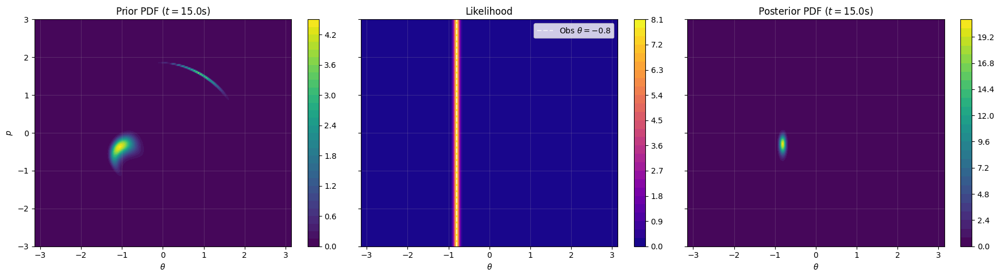

In [5]:
# Set up the new observation
t3 = 15.0
x3 = -0.8
z3_std = 0.05

# Use interpolation to form a function from posterior_t2
posterior_func = pendulum.get_pdf_from_grid(thetas, ps, posterior_t2)

# Push forward the posterior from t1 to form our new prior
_, _, _, prior_t3 = pendulum.advect_pdf_single(
    posterior_func, 
    t3-t2, 
    res=res  
)

# 2. Calculate the Likelihood 
likelihood = norm.pdf(pendulum.wrap_angle(thetas), loc=x3, scale=z3_std)

# 3. Calculate and Normalize Posterior using module utilities
posterior_unnorm = likelihood * prior_t3
evidence = pendulum.compute_normalization(thetas, ps, posterior_unnorm)
posterior_t3 = posterior_unnorm / evidence

# 4. Visualization with independent scales for clarity
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

# Prior: The advected PDF before the observation
im1 = axes[0].contourf(thetas, ps, prior_t3, levels=30, cmap='viridis')
axes[0].set_title(f"Prior PDF ($t={t3:.1f}$s)")
fig.colorbar(im1, ax=axes[0])

# Likelihood: The constraint provided by the data
im2 = axes[1].contourf(thetas, ps, likelihood, levels=30, cmap='plasma')
axes[1].axvline(x3, color='white', linestyle='--', alpha=0.6,  label = fr'Obs $\theta={{{x3}}}$' )
axes[1].set_title(f"Likelihood")
axes[1].legend()
fig.colorbar(im2, ax=axes[1])

# Analysis: The state after Bayesian conditioning
im3 = axes[2].contourf(thetas, ps, posterior_t3, levels=30, cmap='viridis')
axes[2].set_title(f"Posterior PDF ($t={t3:.1f}$s)")
fig.colorbar(im3, ax=axes[2])

for ax in axes:
    ax.set_xlabel(r"$\theta$")
    ax.grid(alpha=0.2)
axes[0].set_ylabel(r"$p$")

plt.tight_layout()
plt.show()


As can be seen, the result of our three measurements is a PDF for the state at time, $t_{3}$, that is quite well localised within the state space. 

Let us suppose that all our observations have now been considered. At time $t_{3}$, we then have a PDF that described our knowledge of the state vector. To form a **forecast** of the state at a later times all we need do is evolve this PDF forward in the usual manner. Within the code below, we form an animation of this forecast over a chosen period of time. 

In [6]:
# Set the end time of the forecast
t4 = 25

# Interpolate the posterior at t3
posterior_func = pendulum.get_pdf_from_grid(thetas, ps, posterior_t3)

# 2. Generate the animation
print("Generating forecast animation...")
forecast_animation = pendulum.animate_pdf(
    posterior_func, 
    t_max=t4-t3, 
    x_lim=(thetas.min(), thetas.max()), 
    y_lim=(ps.min(), ps.max()), 
    res=res,     
    frames=60    
)

# 3. Display in the notebook
pendulum.display_animation_html(forecast_animation)

Generating forecast animation...
Rendering animation for notebook... (this may take a minute)


In obtaining our forecast using this Bayesian approach, we have not needed to explicitly constraint the initial condition. If, however, this is desirable, it can be readily done by pushing the posterior at time, $t_{3}$ back to the initial time:

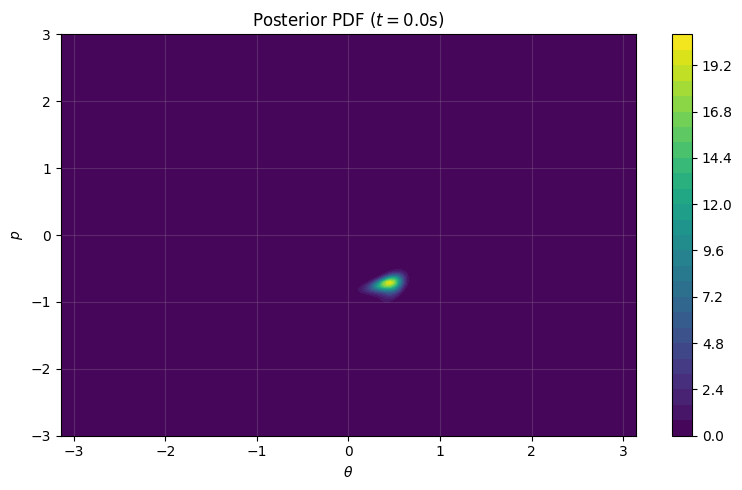

In [7]:
# Push forward the posterior from t3 back to t0
_, _, _, posterior_t0 = pendulum.advect_pdf_single(
    posterior_func, 
    -t3, 
    res=res  
)


# 4. Visualization with independent scales for clarity
fig, ax = plt.subplots(1, 1, figsize=(8, 5), sharey=True)

# Prior: The advected PDF before the observation
im1 = ax.contourf(thetas, ps, posterior_t0, levels=30, cmap='viridis')
ax.set_title(f"Posterior PDF ($t={t0:.1f}$s)")
fig.colorbar(im1, ax=ax)


ax.set_xlabel(r"$\theta$")
ax.grid(alpha=0.2)
ax.set_ylabel(r"$p$")

plt.tight_layout()
plt.show()

Using this estimate on the initial condition, we can also reconstruct with uncertainties the dynamics across the observation period:

In [8]:
# Interpolate the posterior at t0
posterior_func = pendulum.get_pdf_from_grid(thetas, ps, posterior_t0)

# 2. Generate the animation
print("Generating reanalysis animation...")
reanalysis_animation = pendulum.animate_pdf(
    posterior_func, 
    t_max=t3, 
    x_lim=(thetas.min(), thetas.max()), 
    y_lim=(ps.min(), ps.max()), 
    res=res,     
    frames=60    
)

# 3. Display in the notebook
pendulum.display_animation_html(reanalysis_animation)

Generating reanalysis animation...
Rendering animation for notebook... (this may take a minute)
